In [1]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize
from imutils import paths
import numpy as np
import argparse
import imutils
import pickle
import pandas as pd
import cv2
import os
import xlrd
import csv
import matplotlib.pyplot as plt
from scipy import spatial
from sklearn.metrics.pairwise import cosine_similarity
import sklearn
from skimage import filters
import mahotas as mt

from skimage.io import imread, imshow
from skimage.transform import resize
from skimage.feature import hog
from skimage import exposure

In [2]:
def getHist(image_path):
    img = cv2.imread(image_path) 
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    histr = cv2.calcHist([hsv], [0], None, [256], [0, 256])
    return histr

def cosine(a,b):
    dot = np.dot(a.T, b)
    norma = np.linalg.norm(a)
    normb = np.linalg.norm(b)
    cos = dot / (norma * normb)
    return cos

def getEdges(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sobel_img = filters.sobel(img)
    blurred = filters.gaussian(sobel_img, sigma=2.0)
    return blurred.flatten()


def extract_texture(file):
    img = cv2.imread(file)
    g_kernel = cv2.getGaborKernel((21, 21), 8.0, np.pi/4, 10.0, 0.5, 0, ktype=cv2.CV_32F)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    filtered_img = cv2.filter2D(img, cv2.CV_8UC3, g_kernel)

    return filtered_img.flatten()


def Histogram_of_oriented_gradients(img_path):
    img = cv2.imread(img_path)
    resized_img = resize(img, (128,64))

    fd, hog_image = hog(resized_img, orientations=9, pixels_per_cell=(8, 8), 
                    cells_per_block=(2, 2), visualize=True, multichannel=True)
    
    return fd.reshape(fd.shape[0],1)

In [5]:
# h1 = getHist("fashion-dataset/images/1575.jpg")

In [14]:
def get_surf_features(img_path , surf):
    img = cv2.imread(img_path)
    kp, des = surf.detectAndCompute(img,None)
    
    return 

def getTrainImages():
    return 0

    
def getPath(image):
    relativePath = path + image
    return relativePath

def featureNormalisation(vector):
    return normalize(vector, norm='max', axis=0)

def generateWeights():
    meanFeatures = [0,0,0,0]
    for label in train:
        for image in trainFeatures[label]:
            features = trainFeatures[label][image]
            for i in range(len(features)):
                meanFeatures[i]=np.add(meanFeatures[i],features[i])
    return meanFeatures

In [15]:
path = "fashion-dataset/images/"
weights = [1, 0.2, 0.2, 0.4]

In [18]:
def computeScore(testImageFeatures, trainImageFeaures):
    scores = []
    score = 0
    for i in range(len(testImage)):
        if(i==0 or i==3):
            score += weights[i]*cosine(testImageFeatures[i],trainImageFeaures[i])
        
    return score/len(testImageFeatures)     

def generateFeatures(testImage):
    extension = ".jpg"
    testImagePath = path + testImage + extension
    imageData = cv2.imread(testImagePath)
    histogramVector = getHist(testImagePath)
    edgeVector = getEdges(testImagePath)
    textureVector = extract_texture(testImagePath)
    hogVector = Histogram_of_oriented_gradients(testImagePath)
    
    return [histogramVector, edgeVector, textureVector, hogVector]

In [21]:
def generateImageClusters(path, basis):
    file = open("fashion-dataset/style.csv", "r")
    fileContent  =  file.read()
    fileContent = fileContent.split("\n")
    clusters = {}
    for i,line in enumerate(fileContent[1:-1]):
        line = line.split(",")
        imageId = line[0]
        label = line[4]
        if(label not in clusters):
            clusters[label] = []
        clusters[label].append(imageId)
    return clusters


def splitDataSet(clusters):
    trainSet = {}
    testSet = {}
    for label in clusters:
        images = clusters[label]
        size = len(images)
        index = int(size*80/100)
        if(size<=5):
            trainSet[label] = images[0:index]
            testSet[label] = images[index:]
        else:
            trainSet[label] = images[0:5]
            testSet[label] = images[5:10]
        print("train :",label , len(trainSet[label]))
        print("test : ",label , len(testSet[label]))
    return trainSet, testSet


def getTrainingFeatures(trainSet):
    trainFeatures = {}
    extension = ".jpg"
    for j,label in enumerate(trainSet):
        print(j)
        if label not in trainFeatures:
            trainFeatures[label] = {}
        for i, image in enumerate(trainSet[label]):
            imagePath = path+image+extension
            imageData = cv2.imread(imagePath)
            histogramVector = getHist(imagePath)
            edgeVector = getEdges(imagePath)
            textureVector = extract_texture(imagePath)
            hogVector = Histogram_of_oriented_gradients(imagePath)
            trainFeatures[label][image] = [histogramVector, edgeVector, textureVector, hogVector]
#         print(trainFeatures)    
    return trainFeatures



In [24]:
imageClusters = generateImageClusters(path, "articleType")
trainSet, testSet = splitDataSet(imageClusters)

train : Shirts 5
test :  Shirts 5
train : Jeans 5
test :  Jeans 5
train : Watches 5
test :  Watches 5
train : Track Pants 5
test :  Track Pants 5
train : Tshirts 5
test :  Tshirts 5
train : Socks 5
test :  Socks 5
train : Casual Shoes 5
test :  Casual Shoes 5
train : Belts 5
test :  Belts 5
train : Flip Flops 5
test :  Flip Flops 5
train : Handbags 5
test :  Handbags 5
train : Tops 5
test :  Tops 5
train : Bra 5
test :  Bra 5
train : Sandals 5
test :  Sandals 5
train : Shoe Accessories 5
test :  Shoe Accessories 5
train : Sweatshirts 5
test :  Sweatshirts 5
train : Deodorant 5
test :  Deodorant 5
train : Formal Shoes 5
test :  Formal Shoes 5
train : Bracelet 5
test :  Bracelet 5
train : Lipstick 5
test :  Lipstick 5
train : Flats 5
test :  Flats 5
train : Kurtas 5
test :  Kurtas 5
train : Waistcoat 5
test :  Waistcoat 5
train : Sports Shoes 5
test :  Sports Shoes 5
train : Shorts 5
test :  Shorts 5
train : Briefs 5
test :  Briefs 5
train : Sarees 5
test :  Sarees 5
train : Perfume and 

In [25]:
def saveInPickle(data, pickleFile):
    file = open(pickleFile,"wb")
    pickle.dump(data,file)
    file.close()
def loadFromPickle(pickleFile):
    file = open(pickleFile,'rb')
    pickleData = pickle.load(file)
    file.close()
    return pickleData

In [26]:
# trainFeatures = getTrainingFeatures(trainSet)
# saveInPickle(trainFeatures, "trainFeatures")

In [29]:
trainFeatures = loadFromPickle("trainFeatures")

In [96]:
def scatter_plot(precisionList, recallList):
    x = [i for i in range(len(precisionList))]
    plt.plot(x, precisionList, label='precision', color = 'red')
    plt.plot(x, recallList, label='recall', color = "green")
    plt.xlabel('X input')
    plt.ylabel("Y output")
#     plt.title(method+' Regression Curve for degree = '+ str(deg))
    plt.legend()
    plt.show()

In [103]:
# test_image = path + string(1540)
k = 4
precisionList = []
recallList = []
loopCount = 0
correctOutput = 0

for label in testSet:
    for testImage in testSet[label]:
        test_img_path = path+testImage+".jpg"

        try:
            imageList = recommendImages(testImage, 5)
            print("correct answer: ", label)
            print("predicted result: ")
            
            for result in imageList:
                print(result[1], result[2])
            
            for i in imageList:
                if(label == i[2]):
                    correctOutput += 1
                    break
                    
            loopCount += 1
            
            precisionList.append(correctOutput/loopCount)
            recallList.append(correctOutput/585)
            
            print("\n\n")
        
        except:
            pass

fashion-dataset/images/56825.jpg
correct answer:  Shirts
predicted result: 
0.31686246 Shirts
0.3145413 Shirts
0.3136829 Shrug
0.31251514 Sweatshirts
0.31229305 Innerwear Vests



fashion-dataset/images/9452.jpg
correct answer:  Shirts
predicted result: 
0.3226016 Shirts
0.32234055 Sweatshirts
0.31845093 Nehru Jackets
0.3184373 Shirts
0.31723493 Shrug



fashion-dataset/images/4943.jpg
correct answer:  Shirts
predicted result: 
0.31581917 Water Bottle
0.31098738 Lehenga Choli
0.31000313 Water Bottle
0.30904382 Lehenga Choli
0.30810657 Sarees



fashion-dataset/images/9660.jpg
correct answer:  Shirts
predicted result: 
0.29376704 Shapewear
0.29156178 Shirts
0.29092595 Shrug
0.29067266 Shapewear
0.29056 Shrug



fashion-dataset/images/15984.jpg
correct answer:  Shirts
predicted result: 
0.3262329 Shirts
0.32328218 Sweatshirts
0.32291985 Innerwear Vests
0.32235548 Nehru Jackets
0.32049248 Shirts



fashion-dataset/images/26993.jpg
correct answer:  Jeans
predicted result: 
0.32697853 Track

correct answer:  Flip Flops
predicted result: 
0.31720516 Heels
0.31651056 Flip Flops
0.31494004 Flats
0.3092464 Flip Flops
0.30548534 Formal Shoes



fashion-dataset/images/42841.jpg
correct answer:  Handbags
predicted result: 
0.31094527 Laptop Bag
0.3077892 Handbags
0.30618757 Handbags
0.30486155 Laptop Bag
0.30463815 Handbags



fashion-dataset/images/35913.jpg
correct answer:  Handbags
predicted result: 
0.3127808 Backpacks
0.31164163 Kajal and Eyeliner
0.31058416 Handbags
0.30802172 Backpacks
0.30668476 Handbags



fashion-dataset/images/31923.jpg
correct answer:  Handbags
predicted result: 
0.3055797 Tablet Sleeve
0.29824698 Booties
0.29773632 Wallets
0.29640812 Booties
0.29610837 Booties



fashion-dataset/images/58177.jpg
correct answer:  Handbags
predicted result: 
0.31240824 Travel Accessory
0.30963656 Handbags
0.3053968 Laptop Bag
0.30478615 Handbags
0.3039557 Travel Accessory



fashion-dataset/images/21510.jpg
correct answer:  Handbags
predicted result: 
0.31405842 Laptop

correct answer:  Bracelet
predicted result: 
0.30998334 Bangle
0.30679995 Bangle
0.30597186 Bangle
0.2981545 Bangle
0.28876454 Heels



fashion-dataset/images/48570.jpg
correct answer:  Bracelet
predicted result: 
0.31251365 Bangle
0.29608038 Bangle
0.29562545 Bangle
0.29454136 Lip Care
0.28757837 Lip Care



fashion-dataset/images/57563.jpg
correct answer:  Lipstick
predicted result: 
0.3032462 Toner
0.30276427 Face Moisturisers
0.30115741 Concealer
0.3008833 Toner
0.30029452 Face Serum and Gel



fashion-dataset/images/55462.jpg
correct answer:  Lipstick
predicted result: 
0.31808636 Toner
0.3166359 Sunscreen
0.31636047 Face Serum and Gel
0.31373662 Toner
0.31305766 Toner



fashion-dataset/images/56021.jpg
correct answer:  Lipstick
predicted result: 
0.34586787 Lipstick
0.33182943 Lipstick
0.3184299 Lip Liner
0.30975825 Concealer
0.3073173 Lip Gloss



fashion-dataset/images/57597.jpg
correct answer:  Lipstick
predicted result: 
0.30399 Nail Essentials
0.30353776 Lehenga Choli
0.302

correct answer:  Perfume and Body Mist
predicted result: 
0.3045619 Perfume and Body Mist
0.302084 Perfume and Body Mist
0.30011666 Sunscreen
0.2994608 Perfume and Body Mist
0.29869857 Nail Polish



fashion-dataset/images/18466.jpg
correct answer:  Perfume and Body Mist
predicted result: 
0.3162117 Nail Essentials
0.3096063 Nail Polish
0.30954584 Nail Essentials
0.30863404 Nail Polish
0.30696017 Toner



fashion-dataset/images/14431.jpg
correct answer:  Heels
predicted result: 
0.31539187 Formal Shoes
0.3126582 Casual Shoes
0.30953577 Flip Flops
0.30922103 Sports Sandals
0.30788943 Formal Shoes



fashion-dataset/images/14409.jpg
correct answer:  Heels
predicted result: 
0.31238458 Sports Sandals
0.31187925 Sports Sandals
0.30933735 Sports Sandals
0.30880752 Flats
0.30593246 Casual Shoes



fashion-dataset/images/34455.jpg
correct answer:  Heels
predicted result: 
0.30684647 Sports Sandals
0.30448276 Flats
0.30034184 Sports Sandals
0.29986042 Heels
0.29942125 Formal Shoes



fashion-d

correct answer:  Dresses
predicted result: 
0.3129969 Dresses
0.31280163 Jackets
0.31171158 Stoles
0.3098099 Nightdress
0.30973676 Baby Dolls



fashion-dataset/images/59897.jpg
correct answer:  Dresses
predicted result: 
0.3183415 Tracksuits
0.3172331 Tracksuits
0.3168884 Tracksuits
0.3140112 Kurta Sets
0.3126266 Night suits



fashion-dataset/images/36750.jpg
correct answer:  Dresses
predicted result: 
0.31144425 Lehenga Choli
0.3052889 Body Lotion
0.30402496 Body Lotion
0.3032888 Handbags
0.30320767 Lehenga Choli



fashion-dataset/images/46285.jpg
correct answer:  Dresses
predicted result: 
0.31787702 Tunics
0.31702423 Tunics
0.31666154 Shrug
0.3162907 Stoles
0.31615192 Stoles



fashion-dataset/images/6874.jpg
correct answer:  Dresses
predicted result: 
0.31563312 Kurtas
0.3149835 Dupatta
0.31454012 Stoles
0.31370112 Dupatta
0.3136076 Kurtas



fashion-dataset/images/52417.jpg
correct answer:  Night suits
predicted result: 
0.31428578 Tunics
0.3120447 Baby Dolls
0.31172094 Stoles


correct answer:  Caps
predicted result: 
0.32146877 Caps
0.3205068 Caps
0.3182495 Caps
0.31486762 Caps
0.31195498 Hat



fashion-dataset/images/12735.jpg
correct answer:  Caps
predicted result: 
0.32197377 Caps
0.3161421 Caps
0.3160215 Caps
0.3156946 Hat
0.31528056 Caps



fashion-dataset/images/18206.jpg
correct answer:  Caps
predicted result: 
0.3260946 Caps
0.32178363 Caps
0.31679714 Hat
0.31573933 Caps
0.31553358 Caps



fashion-dataset/images/49239.jpg
correct answer:  Caps
predicted result: 
0.31963018 Caps
0.31866583 Caps
0.3180855 Hat
0.3171266 Caps
0.31514892 Caps



fashion-dataset/images/56822.jpg
correct answer:  Trousers
predicted result: 
0.31893688 Churidar
0.31552684 Lounge Pants
0.31480744 Lounge Pants
0.3147569 Tights
0.31324932 Lounge Pants



fashion-dataset/images/27614.jpg
correct answer:  Trousers
predicted result: 
0.31106547 Lounge Pants
0.30864587 Churidar
0.3084872 Rain Trousers
0.3073377 Lounge Pants
0.3066292 Lounge Pants



fashion-dataset/images/26164.jpg

correct answer:  Bath Robe
predicted result: 
0.31579143 Nightdress
0.315353 Jumpsuit
0.31256047 Kurta Sets
0.31211773 Salwar and Dupatta
0.3120075 Dresses



fashion-dataset/images/52512.jpg
correct answer:  Bath Robe
predicted result: 
0.32076132 Stoles
0.31731728 Kurtas
0.31627432 Stoles
0.3159136 Nightdress
0.3152965 Stoles



fashion-dataset/images/52494.jpg
correct answer:  Bath Robe
predicted result: 
0.27971 Bath Robe
0.19932118 Necklace and Chains
0.17613614 Bath Robe
0.15419029 Boxers
0.09797919 Lounge Tshirts



fashion-dataset/images/52495.jpg
correct answer:  Bath Robe
predicted result: 
0.2732795 Bath Robe
0.21555796 Necklace and Chains
0.20774832 Bath Robe
0.098126285 Lounge Tshirts
0.08677389 Stoles



fashion-dataset/images/20064.jpg
correct answer:  Mufflers
predicted result: 
0.31244823 Mufflers
0.31001347 Mufflers
0.30150235 Mufflers
0.2967409 Handbags
0.29615906 Mufflers



fashion-dataset/images/24869.jpg
correct answer:  Mufflers
predicted result: 
0.31864542 Muf

correct answer:  Sports Sandals
predicted result: 
0.31530902 Sandals
0.3152987 Casual Shoes
0.3150557 Sports Shoes
0.31424072 Sports Sandals
0.31403816 Sports Sandals



fashion-dataset/images/8771.jpg
correct answer:  Sports Sandals
predicted result: 
0.3040506 Flip Flops
0.29744074 Flip Flops
0.29646134 Belts
0.29544634 Flip Flops
0.29520267 Heels



fashion-dataset/images/3503.jpg
correct answer:  Sports Sandals
predicted result: 
0.32077557 Sandals
0.31820664 Sports Sandals
0.31706643 Casual Shoes
0.3170387 Casual Shoes
0.3152952 Sports Sandals



fashion-dataset/images/5609.jpg
correct answer:  Sports Sandals
predicted result: 
0.3259581 Sandals
0.3145047 Sports Sandals
0.31342432 Sports Shoes
0.31251583 Sports Shoes
0.3115866 Casual Shoes



fashion-dataset/images/39899.jpg
correct answer:  Sports Sandals
predicted result: 
0.3186956 Sports Sandals
0.31736606 Sports Shoes
0.3169536 Sports Shoes
0.3159309 Sports Shoes
0.31537664 Casual Shoes



fashion-dataset/images/49113.jpg
co

correct answer:  Nightdress
predicted result: 
0.31873268 Kurtas
0.31503874 Tunics
0.3143356 Kurtas
0.31293422 Stoles
0.31265867 Stoles



fashion-dataset/images/52419.jpg
correct answer:  Nightdress
predicted result: 
0.31320378 Kurtas
0.3126987 Kurtas
0.31223482 Stoles
0.31174028 Sarees
0.31114486 Kurtas



fashion-dataset/images/52445.jpg
correct answer:  Nightdress
predicted result: 
0.31526518 Kurtis
0.31472018 Shrug
0.31379083 Stoles
0.31196743 Stoles
0.31107932 Sweatshirts



fashion-dataset/images/51802.jpg
correct answer:  Nightdress
predicted result: 
0.30870277 Shrug
0.30840728 Shrug
0.3078475 Baby Dolls
0.30607724 Nightdress
0.3057629 Scarves



fashion-dataset/images/36367.jpg
correct answer:  Ties
predicted result: 
0.3419194 Ties
0.33976957 Ties
0.3371356 Ties
0.31552684 Highlighter and Blush
0.3120661 Ties



fashion-dataset/images/58916.jpg
correct answer:  Ties
predicted result: 
0.33919498 Ties
0.3352794 Ties
0.33153704 Ties
0.31194735 Highlighter and Blush
0.3096932

correct answer:  Lip Care
predicted result: 
0.30393296 Sunscreen
0.30168504 Nail Polish
0.29972515 Nail Polish
0.2994044 Nail Polish
0.29907334 Body Lotion



fashion-dataset/images/57728.jpg
correct answer:  Lip Care
predicted result: 
0.31071794 Hair Colour
0.3063088 Hair Colour
0.3047583 Eyeshadow
0.30348355 Eyeshadow
0.30334252 Nail Polish



fashion-dataset/images/57729.jpg
correct answer:  Lip Care
predicted result: 
0.30958396 Hair Colour
0.30721447 Earrings
0.3060682 Eyeshadow
0.3052673 Eyeshadow
0.3041459 Hair Colour



fashion-dataset/images/57730.jpg
correct answer:  Lip Care
predicted result: 
0.30432624 Clothing Set
0.30261198 Earrings
0.30184406 Eyeshadow
0.30134815 Eyeshadow
0.29868236 Earrings



fashion-dataset/images/56624.jpg
correct answer:  Face Moisturisers
predicted result: 
0.31512424 Ring
0.31070015 Ring
0.30908304 Toner
0.30657205 Toner
0.30594277 Ring



fashion-dataset/images/57702.jpg
correct answer:  Face Moisturisers
predicted result: 
0.30310613 Eyeshad

correct answer:  Lip Liner
predicted result: 
0.33004194 Lip Gloss
0.32990885 Lip Gloss
0.32698435 Highlighter and Blush
0.3218285 Concealer
0.3168676 Lip Liner



fashion-dataset/images/49148.jpg
correct answer:  Lip Liner
predicted result: 
0.33225104 Lip Gloss
0.33189037 Lip Gloss
0.33068812 Highlighter and Blush
0.325678 Concealer
0.317332 Lip Liner



fashion-dataset/images/49152.jpg
correct answer:  Lip Liner
predicted result: 
0.331095 Lip Gloss
0.33101937 Lip Gloss
0.329474 Highlighter and Blush
0.32350606 Concealer
0.3192145 Lip Liner



fashion-dataset/images/56548.jpg
correct answer:  Lip Liner
predicted result: 
0.3302178 Highlighter and Blush
0.32793087 Mascara
0.32414442 Lip Gloss
0.32398224 Lip Gloss
0.3217028 Concealer



fashion-dataset/images/45087.jpg
correct answer:  Robe
predicted result: 
0.31935513 Salwar and Dupatta
0.31903145 Kurta Sets
0.31875145 Kurta Sets
0.3184808 Robe
0.31800398 Kurta Sets



fashion-dataset/images/50379.jpg
correct answer:  Salwar and Dup

correct answer:  Gloves
predicted result: 
0.30638275 Booties
0.30630463 Booties
0.29881093 Booties
0.29805434 Booties
0.2969009 Clutches



fashion-dataset/images/19543.jpg
correct answer:  Gloves
predicted result: 
0.31839192 Gloves
0.30767897 Gloves
0.29157552 Messenger Bag
0.29026332 Tablet Sleeve
0.290056 Foundation and Primer



fashion-dataset/images/57773.jpg
correct answer:  Mask and Peel
predicted result: 
0.30376238 Travel Accessory
0.30047122 Tablet Sleeve
0.2998466 Tablet Sleeve
0.29940075 Eye Cream
0.29808116 Wallets



fashion-dataset/images/57774.jpg
correct answer:  Mask and Peel
predicted result: 
0.33547932 Face Wash and Cleanser
0.33268178 Sunscreen
0.3188852 Face Wash and Cleanser
0.3180022 Face Wash and Cleanser
0.31785613 Deodorant



fashion-dataset/images/57887.jpg
correct answer:  Mask and Peel
predicted result: 
0.31227002 Wallets
0.30319628 Travel Accessory
0.30097085 Eyeshadow
0.30092564 Wallets
0.30012086 Travel Accessory



fashion-dataset/images/57888.jp

correct answer:  Concealer
predicted result: 
0.3493926 Concealer
0.3249306 Highlighter and Blush
0.31670424 Lip Gloss
0.3165487 Lip Gloss
0.3163577 Lip Liner



fashion-dataset/images/49128.jpg
correct answer:  Concealer
predicted result: 
0.31405777 Face Serum and Gel
0.30859816 Face Moisturisers
0.3085194 Toner
0.30840194 Toner
0.30827227 Lehenga Choli



fashion-dataset/images/49129.jpg
correct answer:  Concealer
predicted result: 
0.3139847 Face Serum and Gel
0.30899763 Face Moisturisers
0.30879 Toner
0.3084987 Toner
0.30835578 Lehenga Choli



fashion-dataset/images/56129.jpg
correct answer:  Concealer
predicted result: 
0.32013035 Highlighter and Blush
0.31621832 Concealer
0.31507155 Lip Gloss
0.31391945 Lip Gloss
0.31386817 Lip Gloss



fashion-dataset/images/56180.jpg
correct answer:  Concealer
predicted result: 
0.3110657 Eyeshadow
0.29582533 Beauty Accessory
0.29385516 Lipstick
0.2908346 Eyeshadow
0.28851175 Lipstick



fashion-dataset/images/37524.jpg
correct answer:  Rompe

correct answer:  Mascara
predicted result: 
0.3170937 Lipstick
0.31257907 Lipstick
0.31153595 Lip Plumper
0.31031227 Lip Plumper
0.3090531 Lip Plumper



fashion-dataset/images/56544.jpg
correct answer:  Mascara
predicted result: 
0.3265008 Highlighter and Blush
0.32375497 Concealer
0.31422877 Lip Gloss
0.3141292 Lip Gloss
0.30873573 Lip Gloss



fashion-dataset/images/57860.jpg
correct answer:  Toner
predicted result: 
0.3320612 Toner
0.32984656 Face Wash and Cleanser
0.32591525 Toner
0.31874055 Toner
0.31860006 Face Wash and Cleanser



fashion-dataset/images/40826.jpg
correct answer:  Cushion Covers
predicted result: 
0.30126622 Belts
0.3002556 Belts
0.29914612 Formal Shoes
0.29761288 Caps
0.29677624 Caps



fashion-dataset/images/42066.jpg
correct answer:  Key chain
predicted result: 
0.31306878 Sunscreen
0.312584 Water Bottle
0.31156725 Water Bottle
0.31037927 Nail Essentials
0.30982876 Sunscreen



fashion-dataset/images/55198.jpg
correct answer:  Makeup Remover
predicted result:

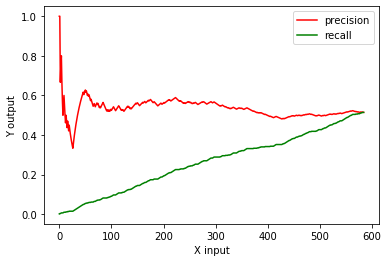

In [105]:
scatter_plot(precisionList, recallList)

In [106]:
print(len(precisionList), correctOutput/(585))

585 0.5145299145299145


fashion-dataset/images/56825.jpg
correct answer:  Shirts


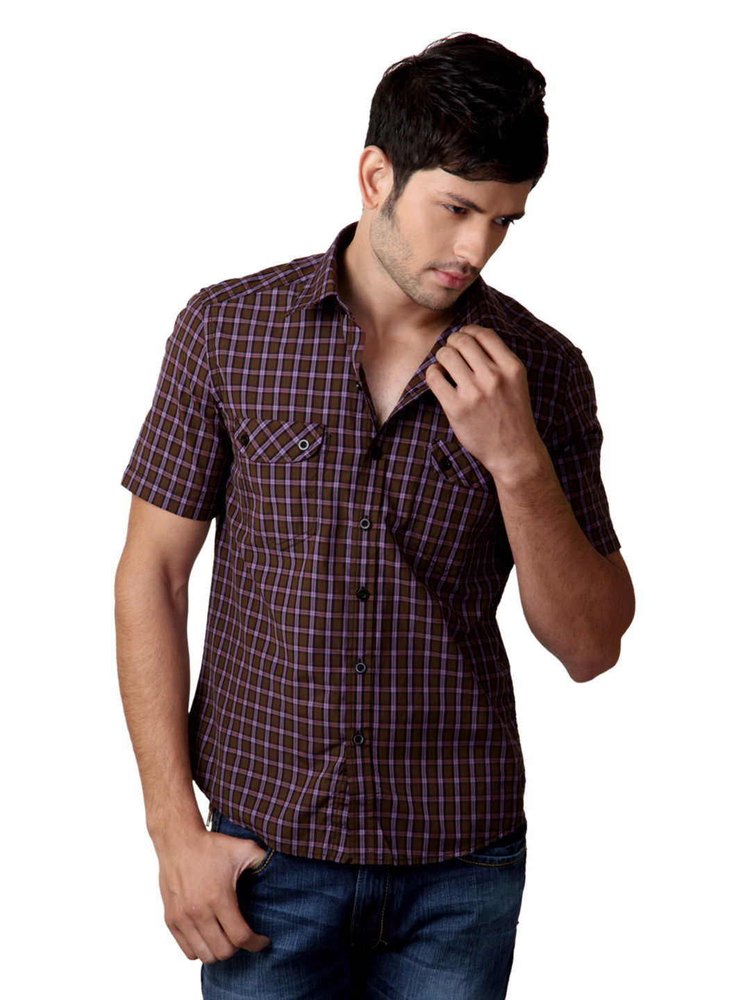

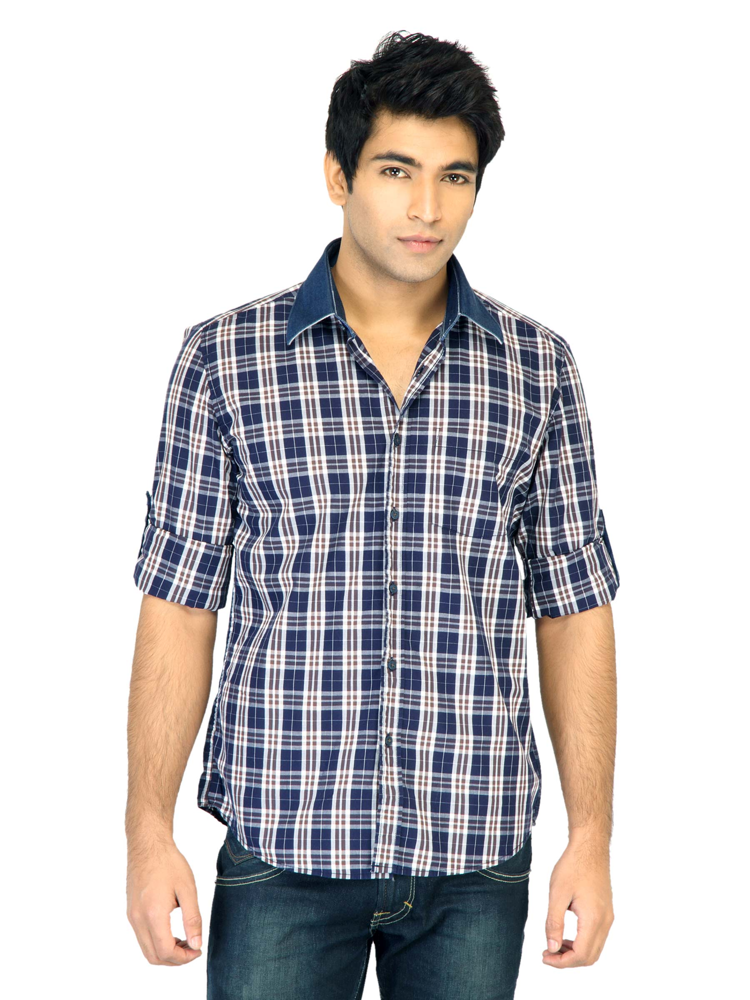

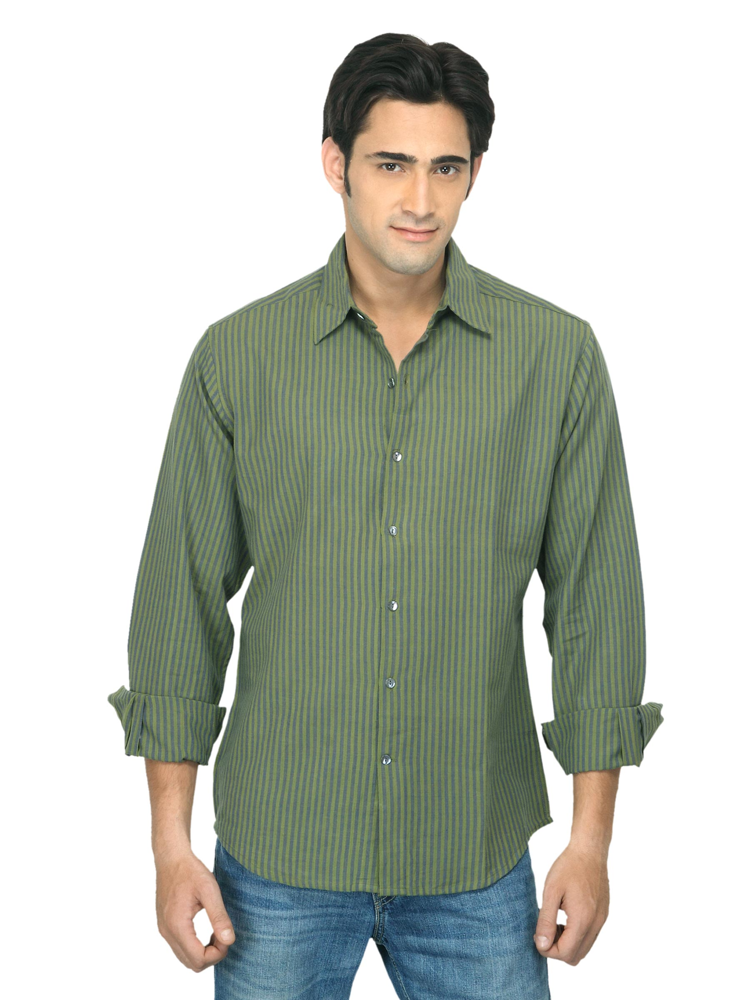

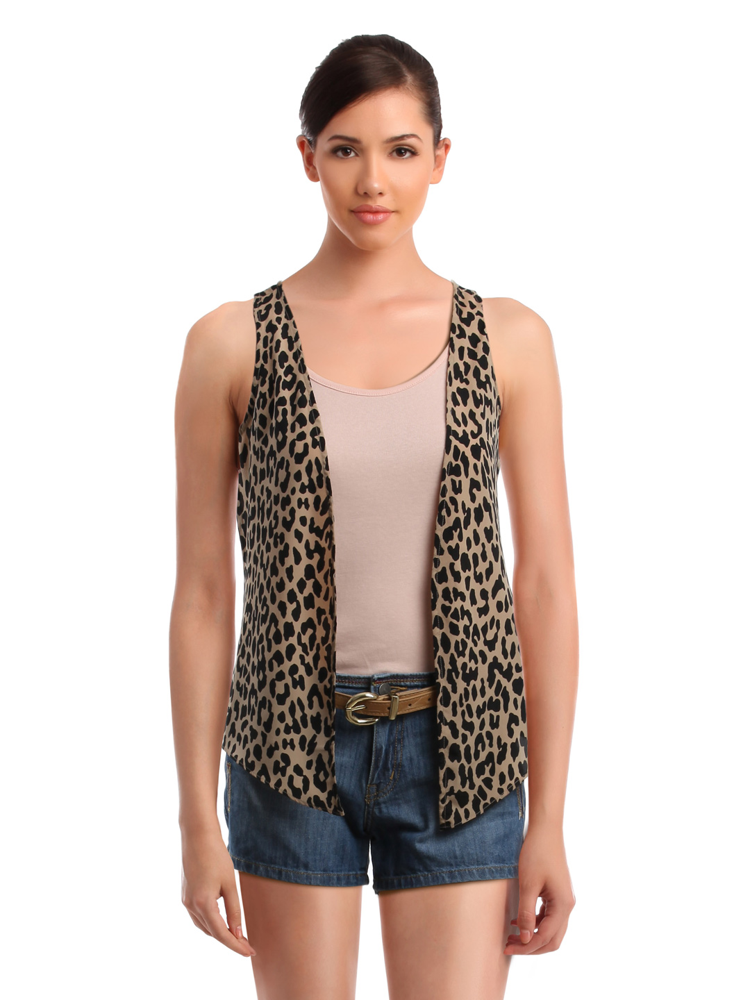

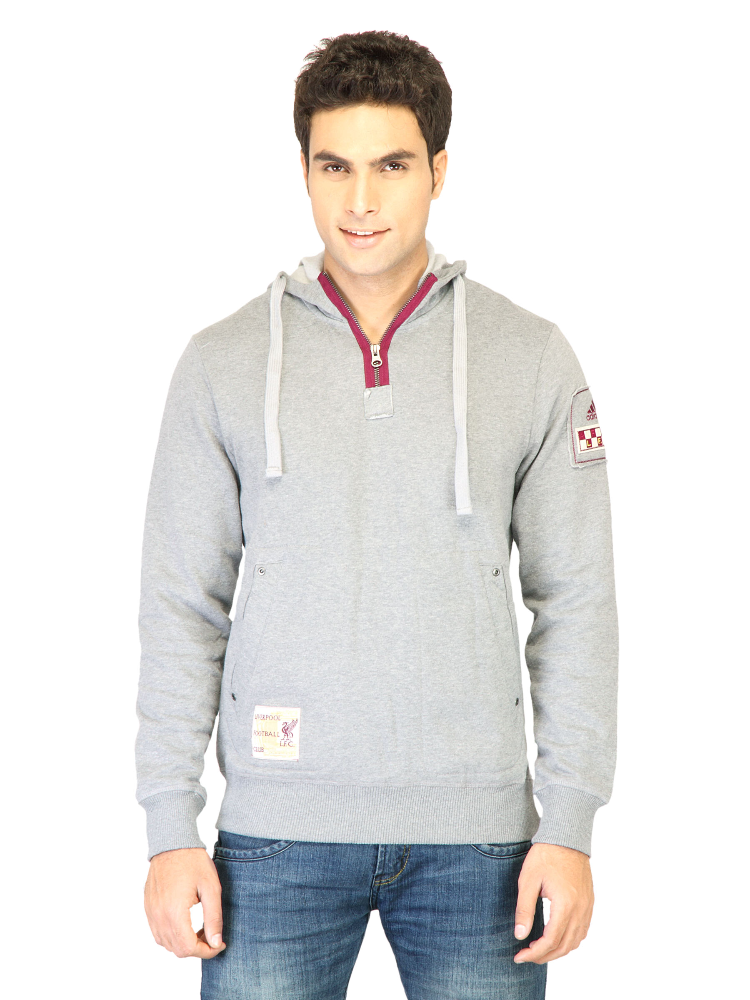

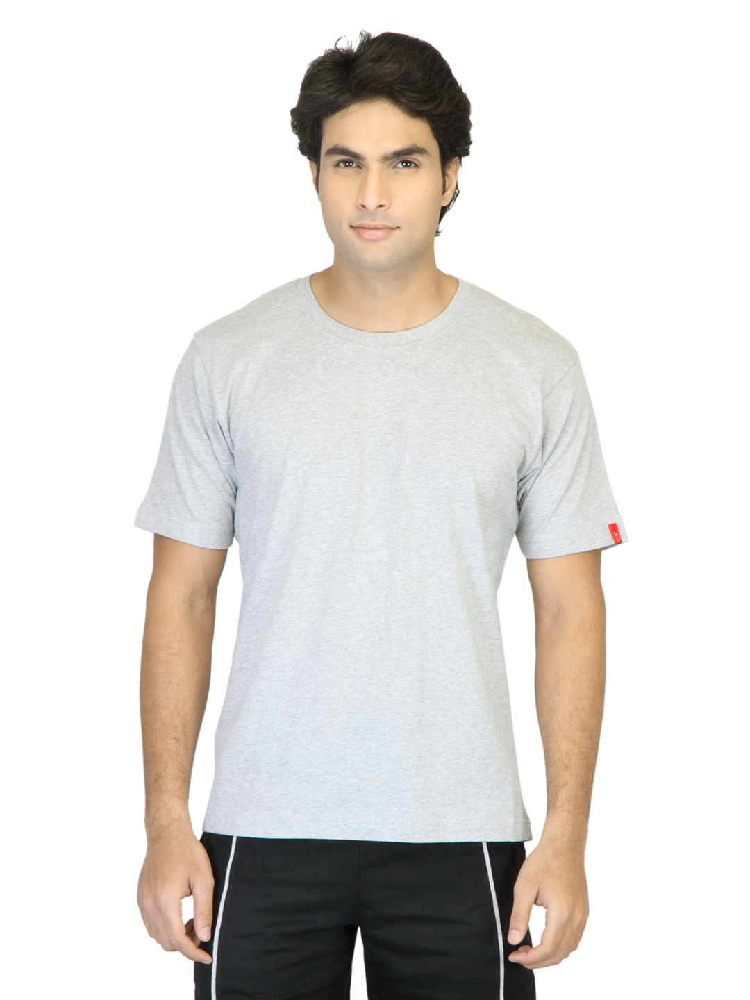






fashion-dataset/images/9452.jpg
correct answer:  Shirts


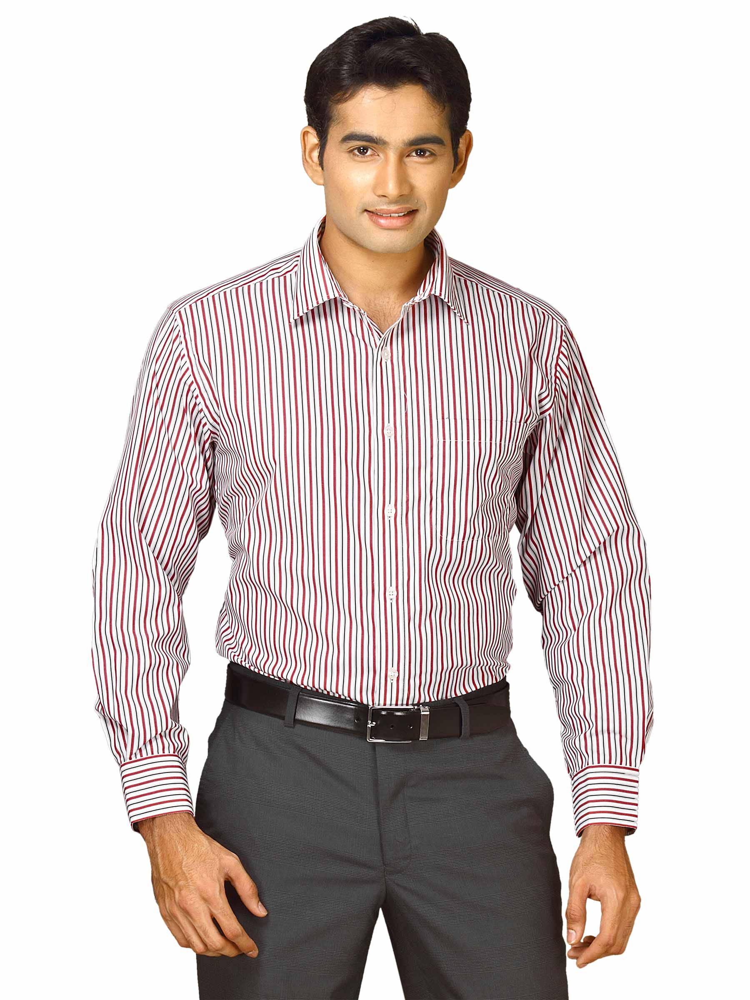

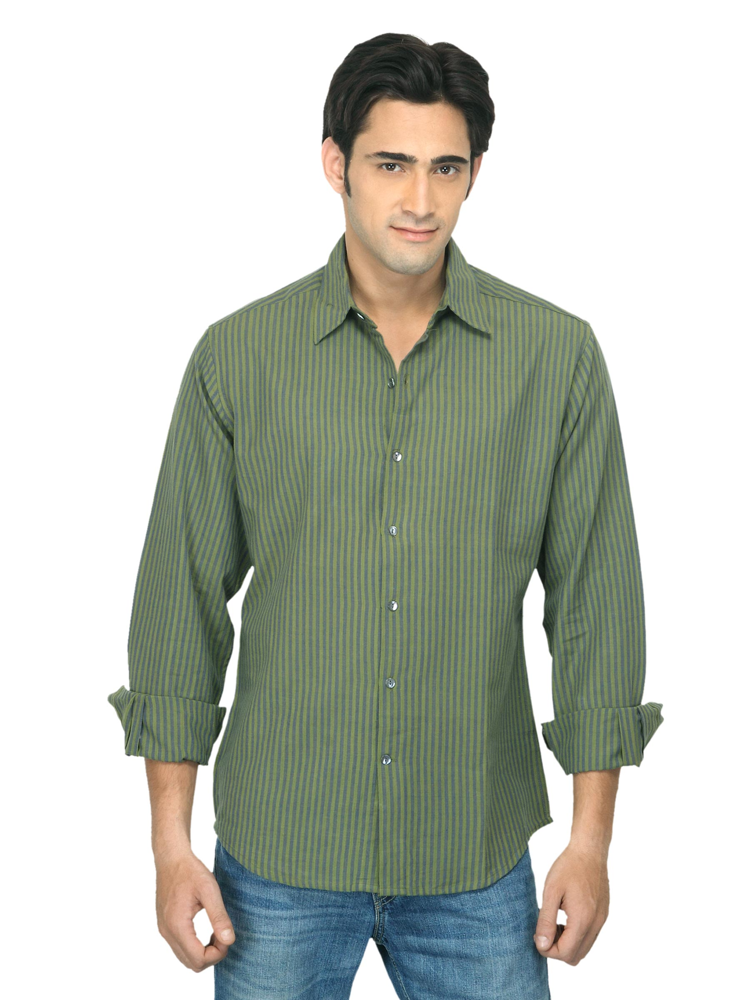

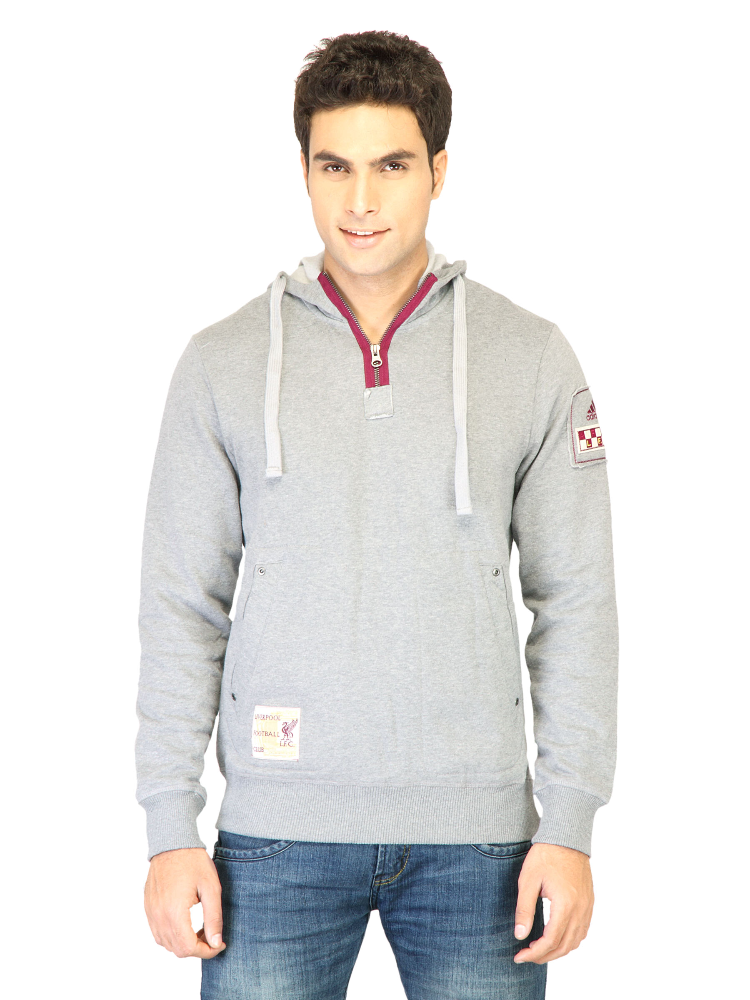

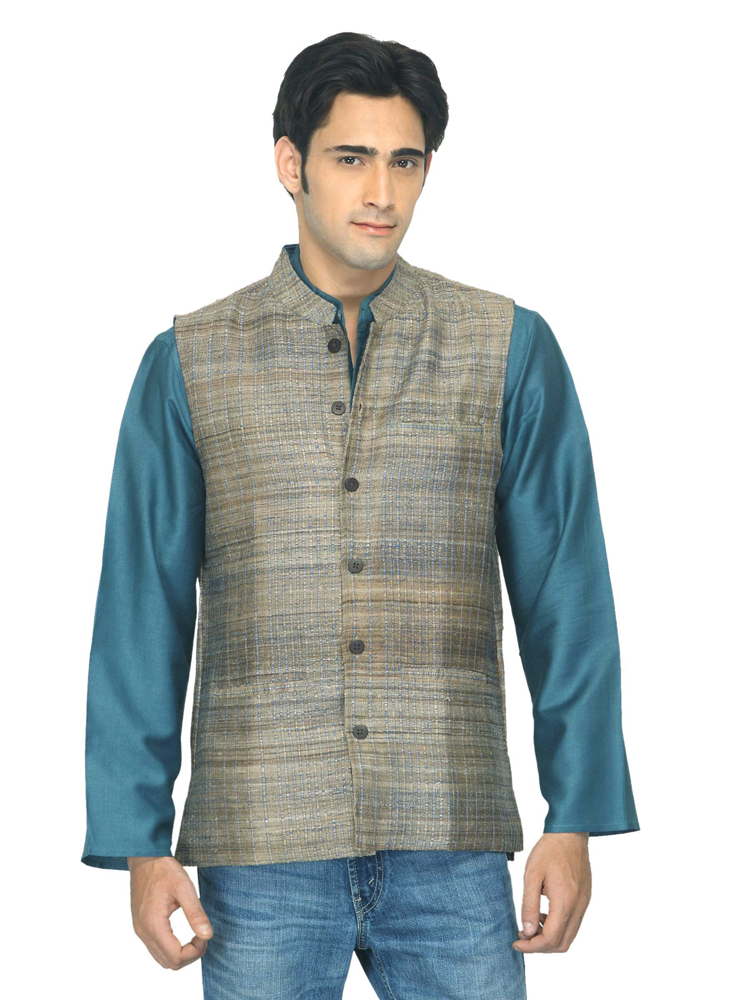

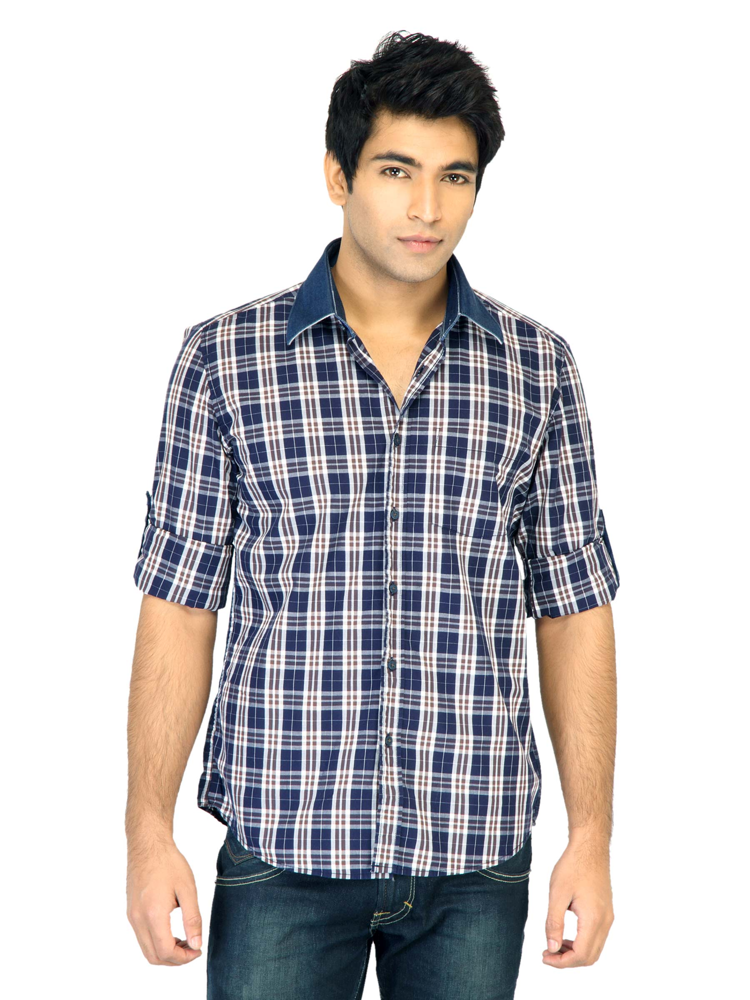

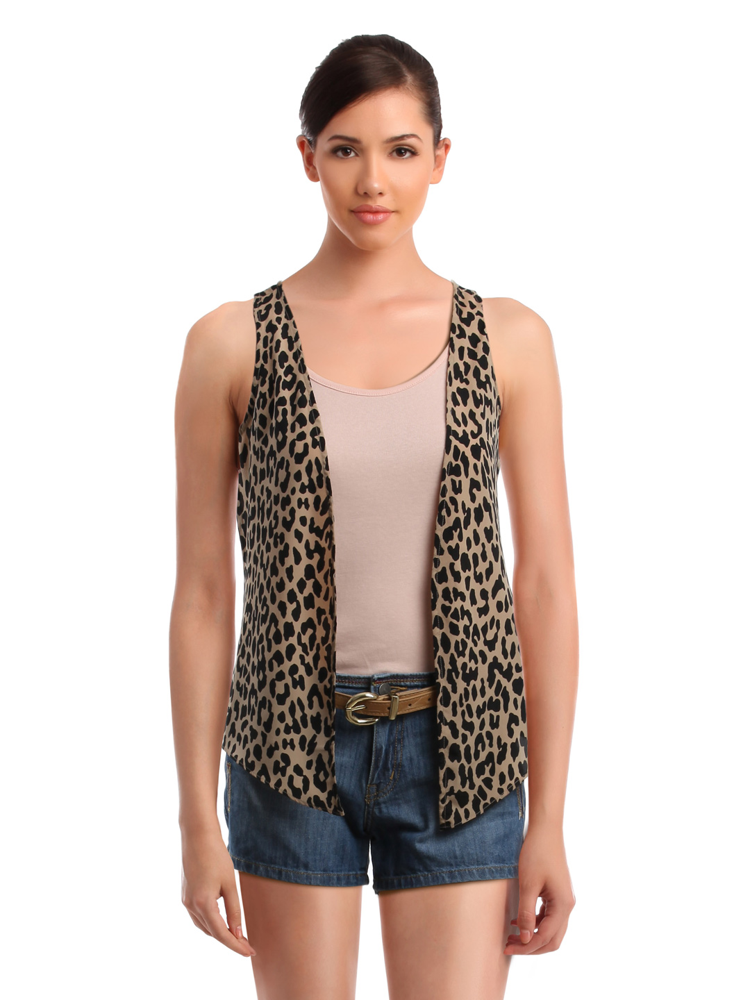

fashion-dataset/images/26993.jpg
correct answer:  Jeans


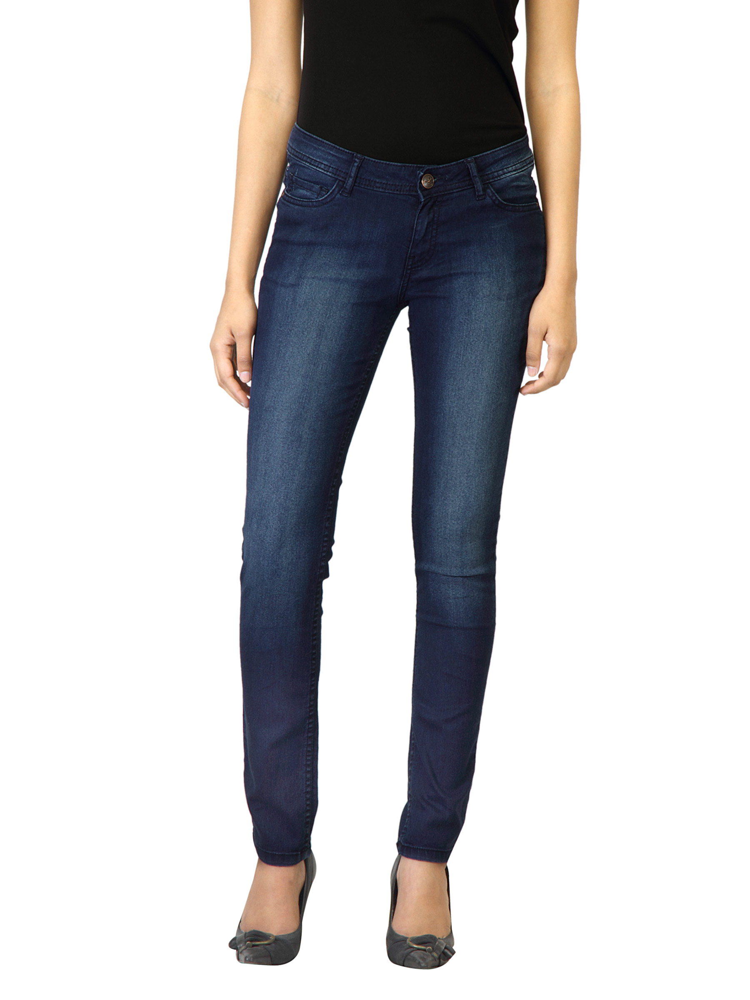

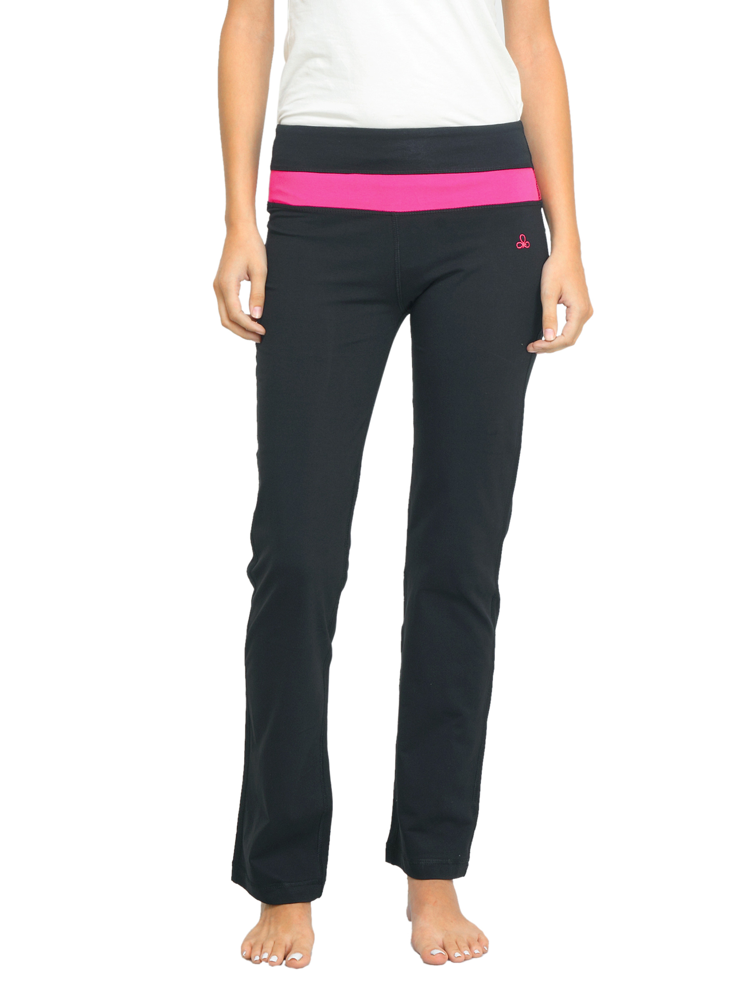

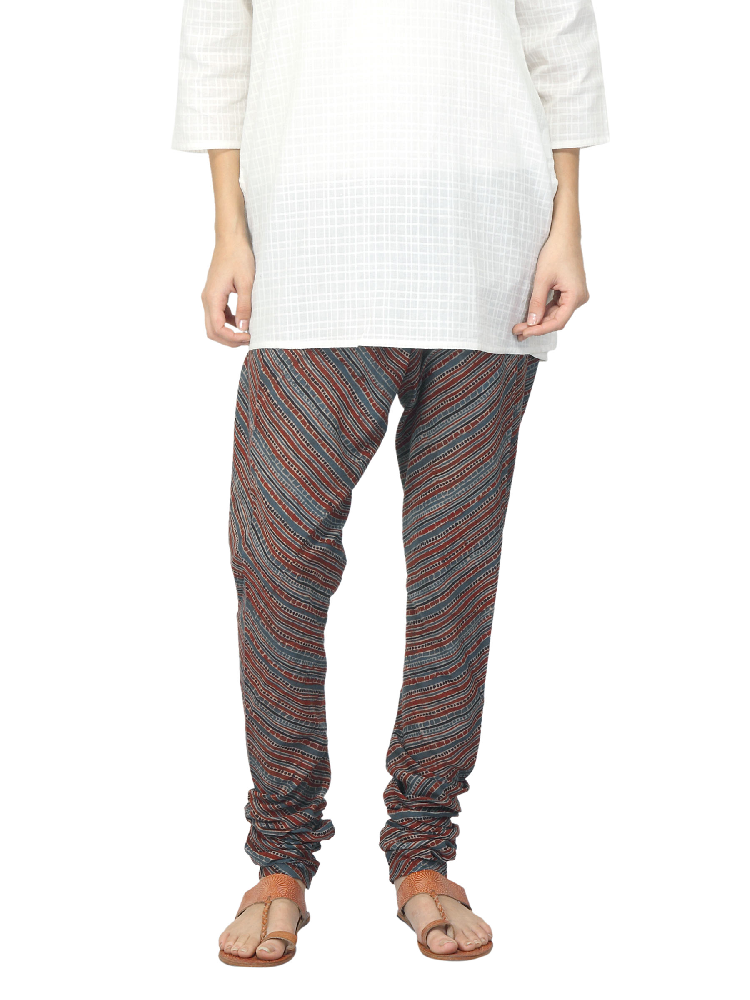

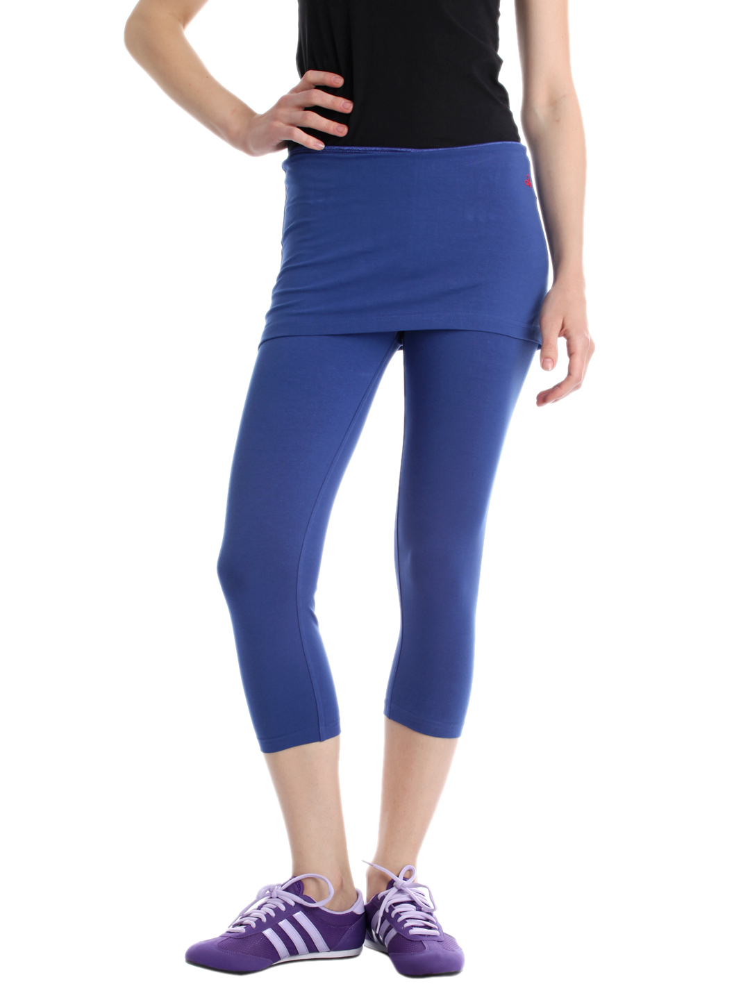

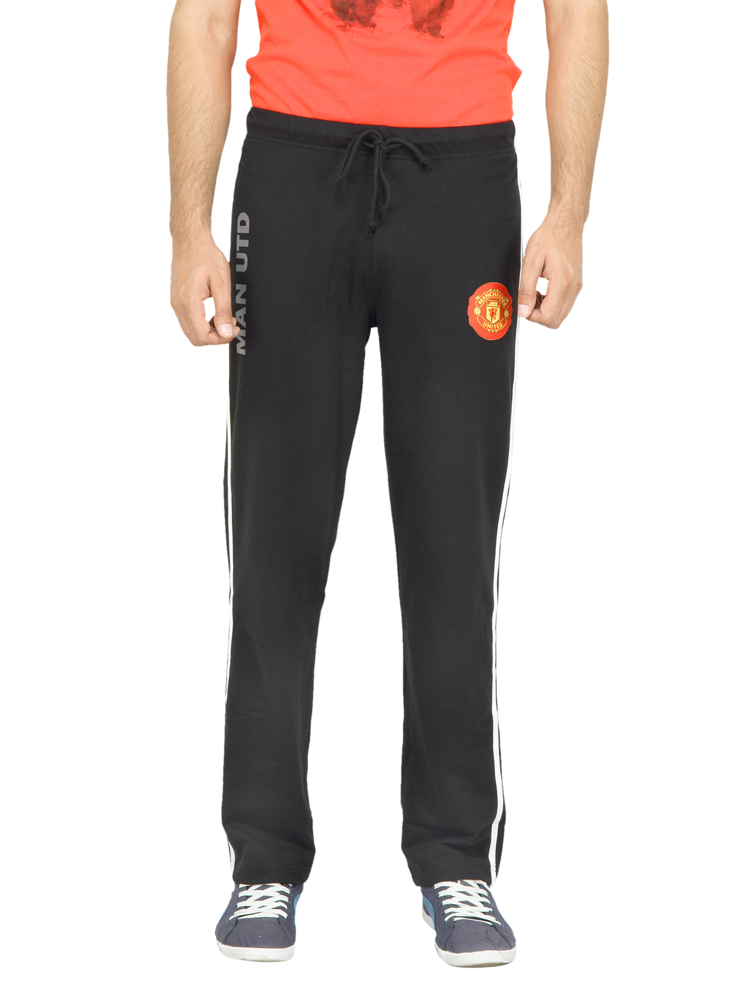

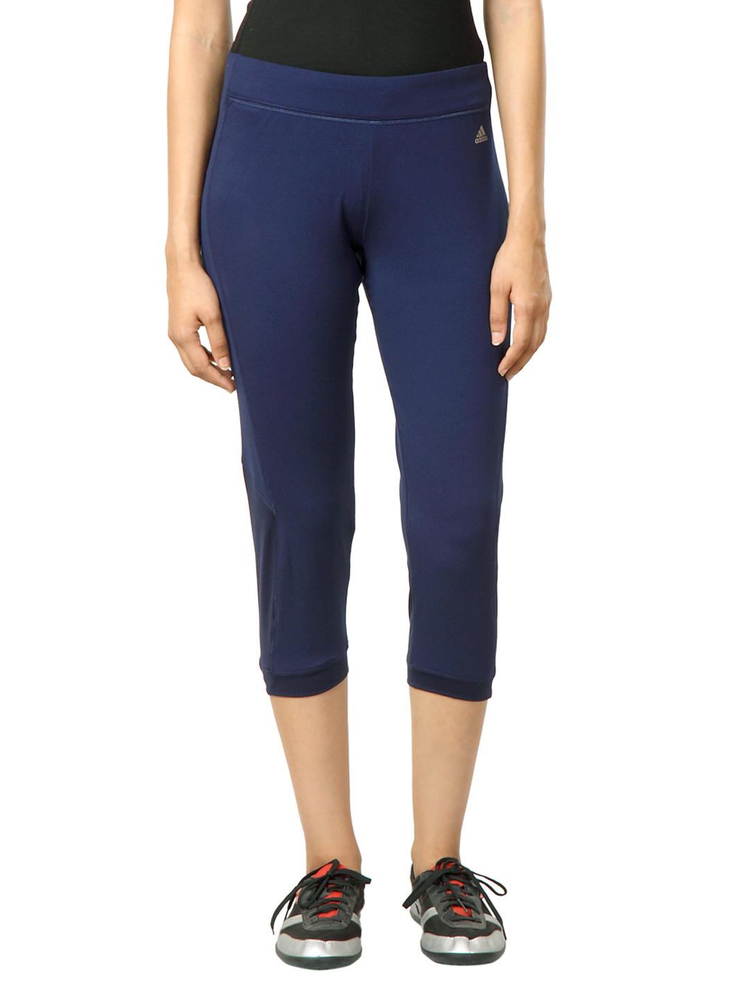






fashion-dataset/images/51499.jpg
correct answer:  Jeans


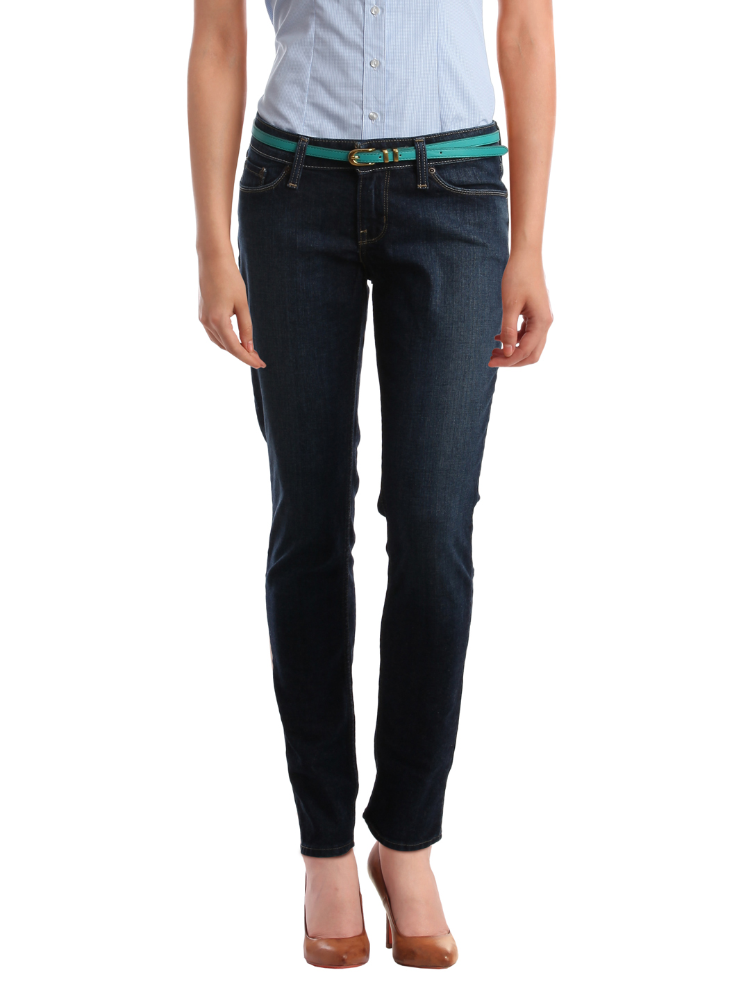

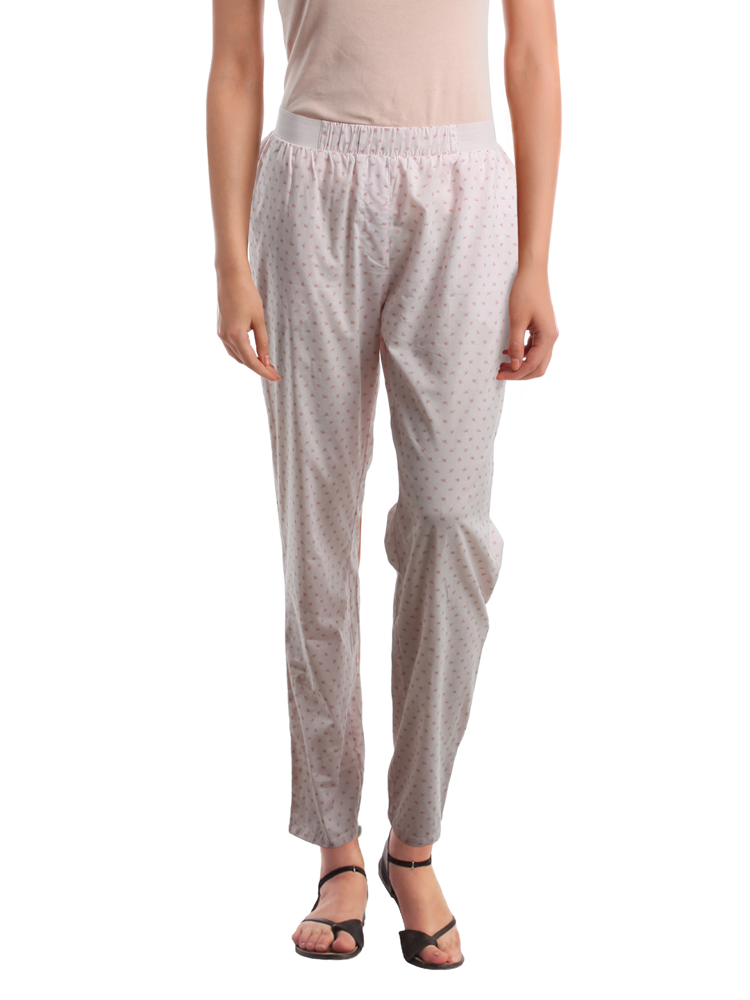

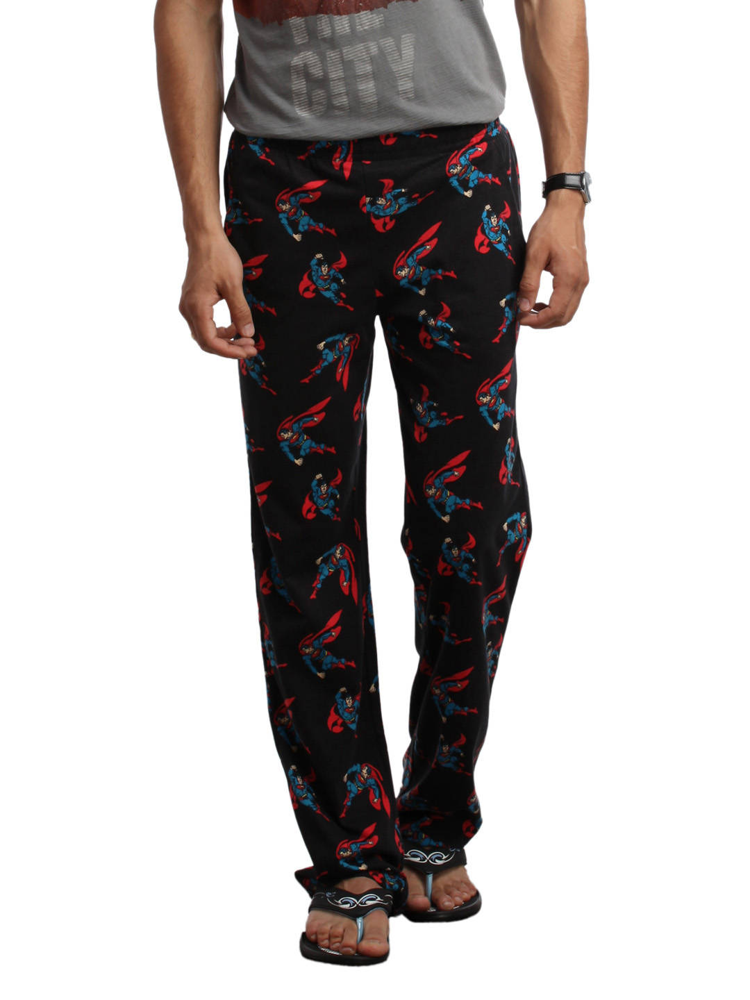

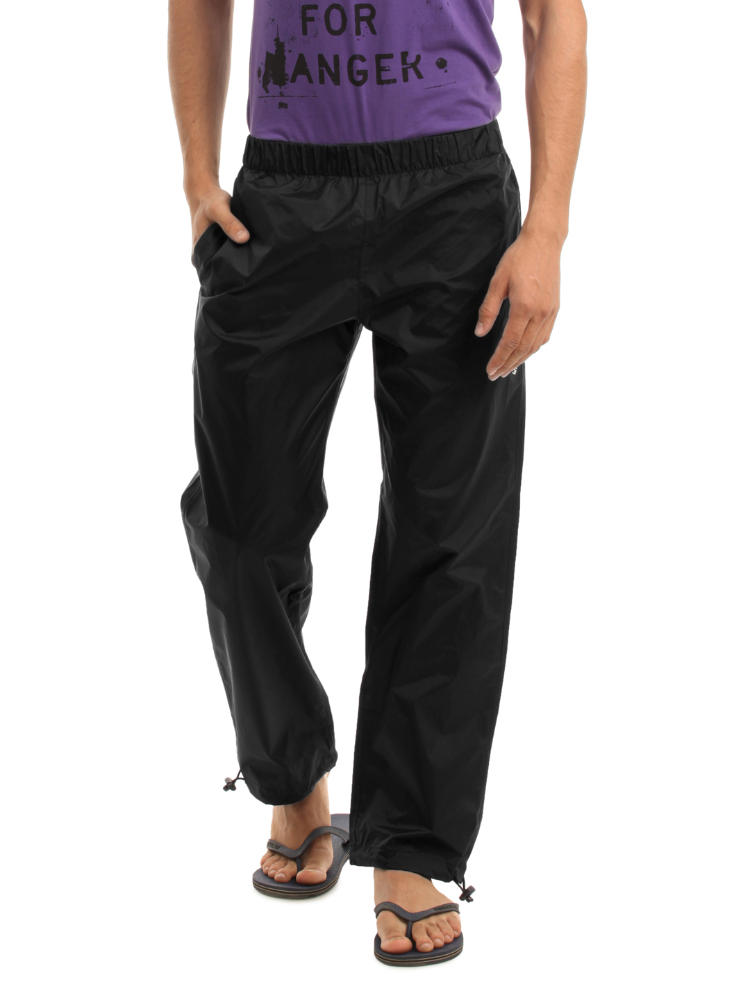

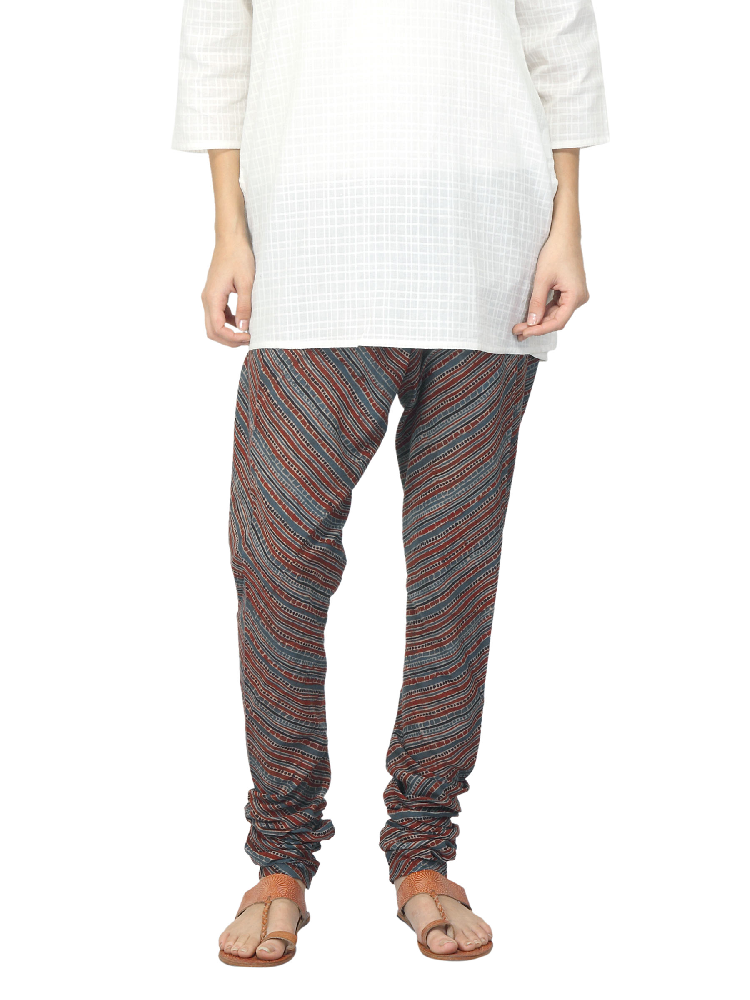

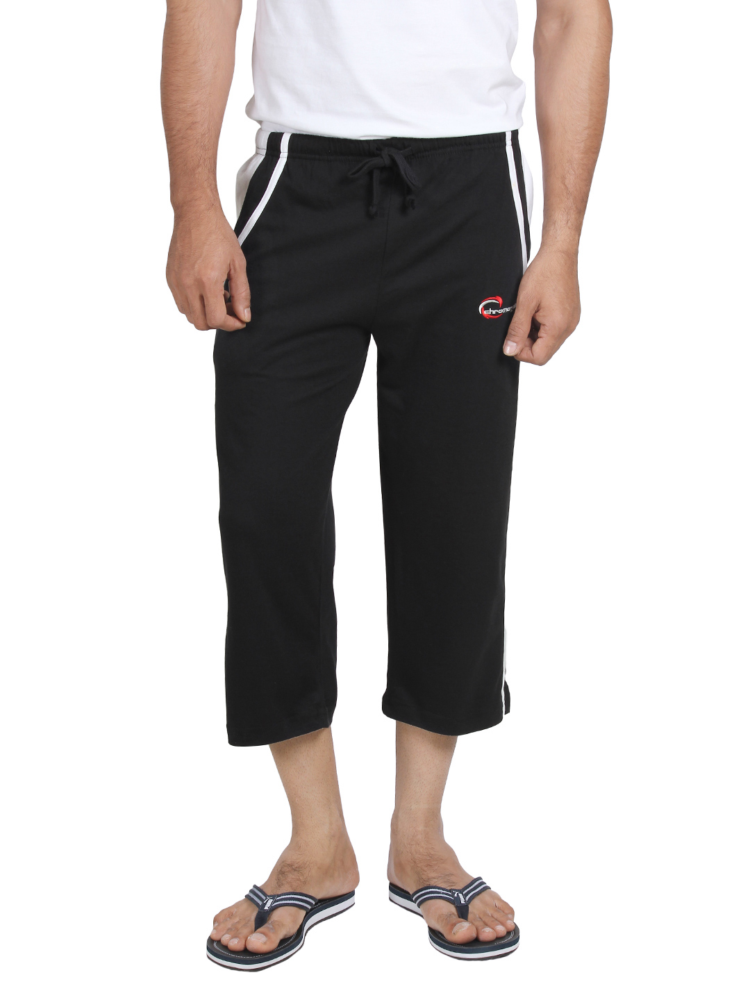

585 301 284


<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

In [114]:
count1 = 0
from IPython.display import Image
import matplotlib.image as mpimg

for label in testSet:
    count2 = 0
    for testImage in testSet[label]:
        flag = True
        
        test_img_path = path+testImage+".jpg"

        try:
            imageList = recommendImages(testImage, 5)
            print("correct answer: ", label)
            display(Image(filename=test_img_path))
#             print("yolo1: ", len(imageList))
            
            plt.figure(figsize=(20,10))
#             print(imageList)
            columns = 5
            for i1, image in enumerate(imageList):
#                 print("myImage", i1, image)
                print("\n")
                display(Image(filename=image[0]))
#                 img = mpimg.imread(i[0])
#                 imgplot = plt.imshow(img)
#                 plt.show()
#                 sleep(4)
                
            if count2 == 1:
                break
            count2 += 1
#             sleep(4)
            print("\n\n\n\n")
        
        except:
            pass
        
    
    
    if count1 == 1:
        break
    count1 += 1

print(totalOutput, correctOutput, falsePositive)

In [31]:
# surf = cv2.SURF(400)
# h2 = get_surf_features("D:\\IIITD\\SEM2\\IR\\project\\fashion-dataset\\images\\1889.jpg",surf) #fifa blue tshirt
# h3 = get_surf_features("D:\\IIITD\\SEM2\\IR\\project\\fashion-dataset\\images\\1915.jpg",surf) #quechua yellow green bottle
# h4 = get_surf_features("D:\\IIITD\\SEM2\\IR\\project\\fashion-dataset\\images\\1890.jpg",surf) #fifa red tshirt
# h5 = get_surf_features("D:\\IIITD\\SEM2\\IR\\project\\fashion-dataset\\images\\1891.jpg",surf) #fifa white tshirt
# h6 = get_surf_features("D:\\IIITD\\SEM2\\IR\\project\\fashion-dataset\\images\\1910.jpg",surf) #black tshirt
# h7 = get_surf_features("D:\\IIITD\\SEM2\\IR\\project\\fashion-dataset\\images\\1810.jpg",surf) #red tshirt

In [32]:
###############DONT LOOK ANYTHING BEYOND THIS#######################################################################33
######################################################################################################################
########################333

In [33]:
# blurred = filters.gaussian(sobel_img, sigma=2.0)
# print(blurred.flatten().shape)
# plt.imshow(blurred)

In [34]:
# light_spots = np.array((img > 245).nonzero()).T
# light_spots.shape
# plt.plot(light_spots[:, 1], light_spots[:, 0], 'o')
# plt.imshow(img)
# plt.title('light spots in image')

In [35]:
# dark_spots = np.array((img < 3).nonzero()).T
# dark_spots.shape
# plt.plot(dark_spots[:, 1], dark_spots[:, 0], 'o')
# plt.imshow(img)
# plt.title('dark spots in image')

In [36]:
# from scipy import ndimage as ndi
# bool_mask = np.zeros(img.shape, dtype=np.bool)
# bool_mask[tuple(light_spots.T)] = True
# bool_mask[tuple(dark_spots.T)] = True
# seed_mask, num_seeds = ndi.label(bool_mask)
# num_seeds

In [37]:
# from skimage import morphology
# ws = morphology.watershed(blurred, seed_mask)
# plt.imshow(ws)

In [38]:
# background = max(set(ws.ravel()), key=lambda g: np.sum(ws == g))
# background

In [39]:
# background_mask = (ws == background)
# plt.imshow(~background_mask)

In [40]:
# def removeBG(foreground):
# #     foreground = cv2.imread(source)
#     foreground = cv2.cvtColor(foreground, cv2.COLOR_BGR2RGB)
#     foreground = cv2.resize(foreground,(r.shape[1],r.shape[0]))
#     background = 255 * np.ones_like(rgb).astype(np.uint8)
#     foreground = foreground.astype(float)
#     background = background.astype(float)
#     th, alpha = cv2.threshold(np.array(rgb),0,255, cv2.THRESH_BINARY)
#     alpha = cv2.GaussianBlur(alpha, (7,7),0)
#     alpha = alpha.astype(float)/255
#     foreground = cv2.multiply(alpha, foreground)
#     background = cv2.multiply(1.0 - alpha, background)
#     outImage = cv2.add(foreground, background)
#     return outImage/255


In [41]:
# image_path = "D:\\IIITD\\SEM2\\IR\\project\\fashion-dataset\\images\\1538.jpg"
# img = cv2.imread(image_path)
# img = removeBG(img)
# plt.plot(img) 
# plt.show()